<a href="https://colab.research.google.com/github/rohit-negi69/cats-vs-dogs-classification/blob/main/CatVsDogClassificationCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Download the updated dataset
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

# Unzip the downloaded file
import zipfile
import os

zip_path = "kagglecatsanddogs_5340.zip"
extract_to = "/content/cats_and_dogs_dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# Confirm the structure
print("Extracted folders:", os.listdir(extract_to))


--2025-09-07 07:02:47--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.192.208.155, 2600:1409:3c00:c80::317f, 2600:1409:3c00:c8c::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.192.208.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   102MB/s    in 8.4s    

2025-09-07 07:02:55 (93.6 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]

Extracted folders: ['CDLA-Permissive-2.0.pdf', 'PetImages', 'readme[1].txt']


In [ ]:
!pip install tensorflow

In [ ]:
import os

data_dir = "/content/cats_and_dogs_dataset/PetImages"

print("Subfolders:", os.listdir(data_dir))
print("Number of cat images:", len(os.listdir(os.path.join(data_dir, "Cat"))))
print("Number of dog images:", len(os.listdir(os.path.join(data_dir, "Dog"))))


Subfolders: ['Dog', 'Cat']
Number of cat images: 12501
Number of dog images: 12501


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

In [ ]:
data_dir = "/content/cats_and_dogs_dataset/PetImages"
input_path = []
label = []

# Loop over Cat and Dog folders
for class_name in os.listdir(data_dir):
    class_path = os.path.join(data_dir, class_name)
    if not os.path.isdir(class_path):  # skip files like readme.txt
        continue

    for path in os.listdir(class_path):
        full_path = os.path.join(class_path, path)

        # Skip broken files (like 0 KB)
        if os.path.getsize(full_path) == 0:
            continue

        input_path.append(full_path)
        if class_name == "Cat":
            label.append(0)
        else:
            label.append(1)

print("Total samples:", len(input_path))
print("First image path:", input_path[0])
print("First label:", label[0])


Total samples: 25000
First image path: /content/cats_and_dogs_dataset/PetImages/Dog/9297.jpg
First label: 1


In [ ]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,/content/cats_and_dogs_dataset/PetImages/Dog/1...,1
1,/content/cats_and_dogs_dataset/PetImages/Cat/8...,0
2,/content/cats_and_dogs_dataset/PetImages/Dog/6...,1
3,/content/cats_and_dogs_dataset/PetImages/Cat/1...,0
4,/content/cats_and_dogs_dataset/PetImages/Dog/1...,1


In [ ]:
valid_images = []
valid_labels = []

for img, lbl in zip(df['images'], df['label']):
    # keep only .jpg files
    if not img.lower().endswith(".jpg"):
        continue

    # skip empty/corrupted files
    if os.path.getsize(img) == 0:
        continue

    valid_images.append(img)
    valid_labels.append(lbl)

# Create cleaned DataFrame
clean_df = pd.DataFrame({
    "images": valid_images,
    "label": valid_labels
}).sample(frac=1).reset_index(drop=True)

print("Original dataset size:", len(df))
print("Cleaned dataset size:", len(clean_df))
clean_df.head()

Original dataset size: 25000
Cleaned dataset size: 24998


,images,label
0,/content/cats_and_dogs_dataset/PetImages/Cat/4...,0
1,/content/cats_and_dogs_dataset/PetImages/Dog/1...,1
2,/content/cats_and_dogs_dataset/PetImages/Dog/3...,1
3,/content/cats_and_dogs_dataset/PetImages/Cat/5...,0
4,/content/cats_and_dogs_dataset/PetImages/Dog/1...,1


In [ ]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)

In [ ]:
print("Total broken images:", len(l))
print("Examples:", l[:10])  # show first 10 bad files

Total broken images: 2
Examples: ['/content/cats_and_dogs_dataset/PetImages/Cat/Thumbs.db', '/content/cats_and_dogs_dataset/PetImages/Dog/Thumbs.db']


In [ ]:
# Remove bad images from df
df = df[~df['images'].isin(l)].reset_index(drop=True)

print("Clean dataset size:", len(df))

Clean dataset size: 24998


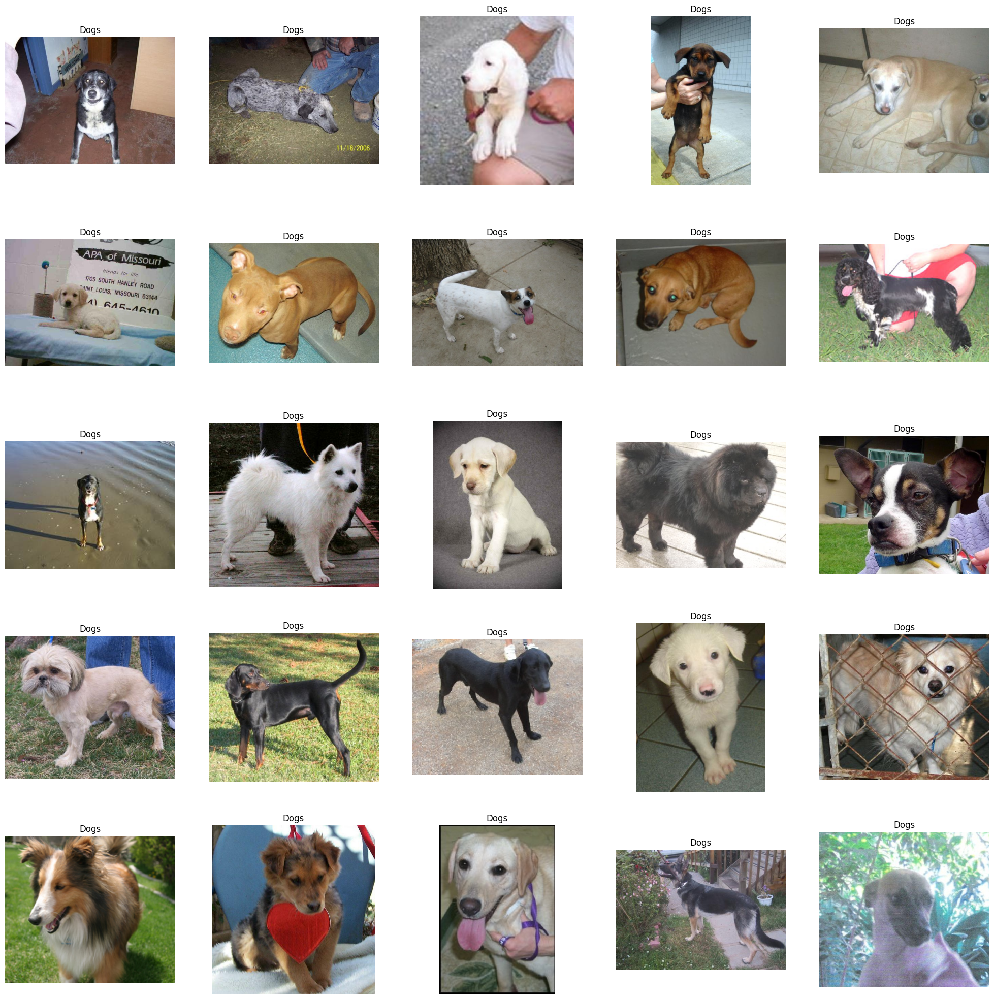

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

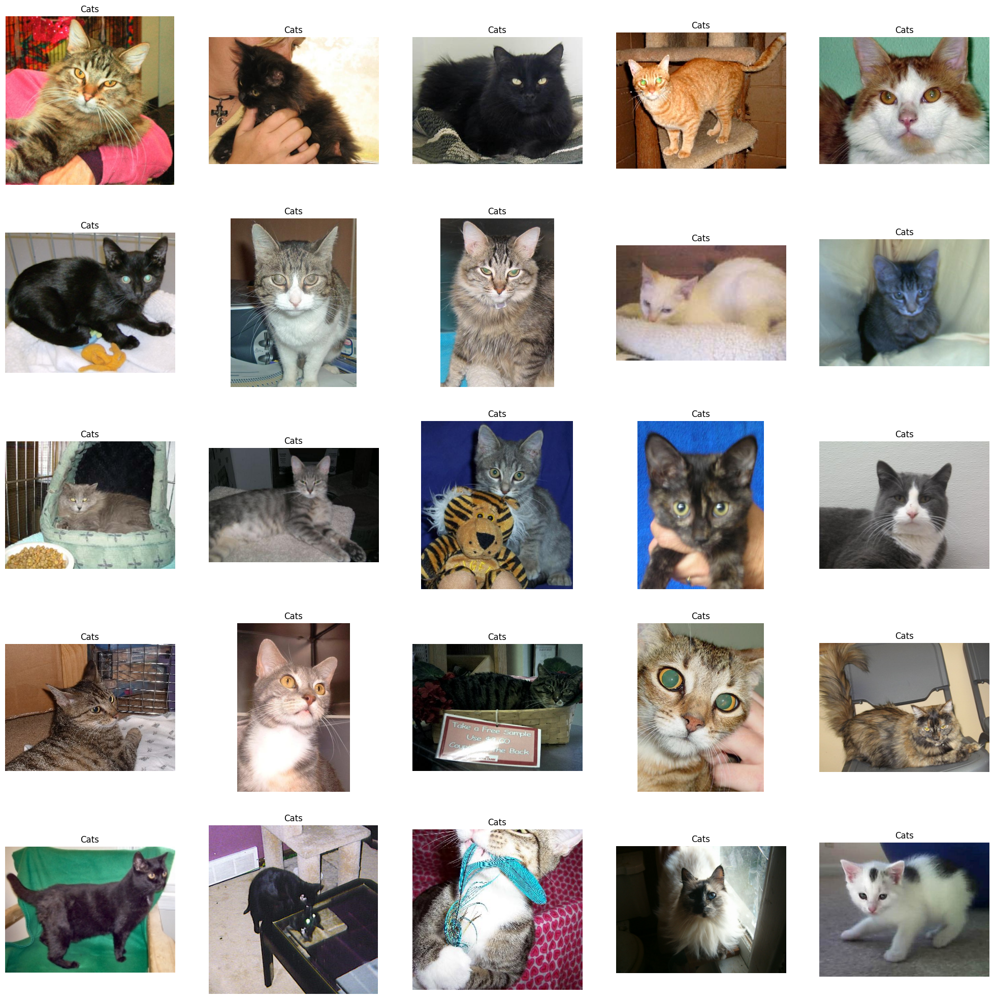

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

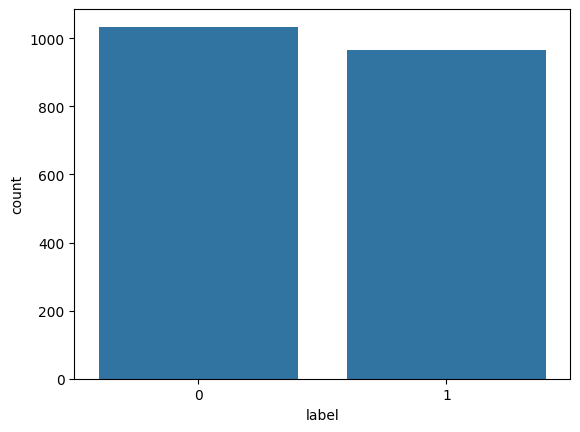

In [ ]:
sns.countplot(x='label', data=df.sample(2000))  # just 2000 rows instead of 25k
plt.show()

In [ ]:
df['label'] = df['label'].astype('str')

In [ ]:
df.head()

,images,label
0,/content/cats_and_dogs_dataset/PetImages/Dog/1...,1
1,/content/cats_and_dogs_dataset/PetImages/Cat/8...,0
2,/content/cats_and_dogs_dataset/PetImages/Dog/6...,1
3,/content/cats_and_dogs_dataset/PetImages/Cat/1...,0
4,/content/cats_and_dogs_dataset/PetImages/Dog/1...,1


In [ ]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [ ]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 123s 3s/step - accuracy: 0.5051 - loss: 0.8871 - val_accuracy: 0.5824 - val_loss: 0.6760
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 108s 3s/step - accuracy: 0.6108 - loss: 0.6604 - val_accuracy: 0.6250 - val_loss: 0.6464
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 107s 3s/step - accuracy: 0.6564 - loss: 0.6237 - val_accuracy: 0.6568 - val_loss: 0.6221
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 106s 3s/step - accuracy: 0.6800 - loss: 0.5994 - val_accuracy: 0.7098 - val_loss: 0.5730
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - accuracy: 0.6997 - loss: 0.5745 - val_accuracy: 0.7236 - val_loss: 0.5443
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - accuracy: 0.7265 - loss: 0.5462 - val_accuracy: 0.7414 - val_loss: 0.5277
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 108s 3s/step - accuracy: 0.7244 - loss: 0.5424 - val_accuracy: 0.7402 - val_loss: 0.5214
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - accuracy: 0.7472 - loss: 0.5112 - val_accuracy: 0.7654 - v

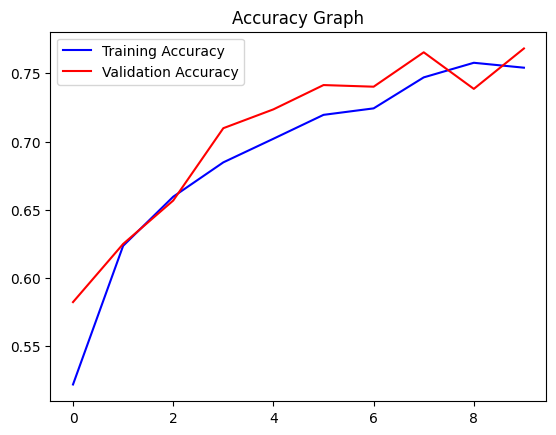

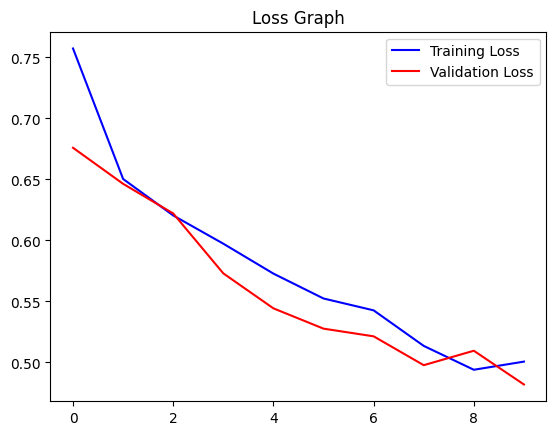

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [ ]:
import os
print(os.getcwd())
print(os.listdir())  # see all files in /content


/content
['.config', '998.jpg', 'kagglecatsanddogs_5340.zip', 'cats_and_dogs_dataset', 'sample_data']


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

def predict_image_from_path(model, image_path, target_size=(128,128)):
    # 1️⃣ Load image with OpenCV
    img = cv2.imread(image_path)
    if img is None:
        print("Image not found at path:", image_path)
        return

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img_resized = cv2.resize(img, target_size)  # Resize to model input

    # 2️⃣ Normalize
    img_array = img_resized / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

    # 3️⃣ Display image
    plt.imshow(img_resized)
    plt.axis('off')
    plt.show()

    # 4️⃣ Predict
    pred = model.predict(img_array)
    label = 'Dog' if pred[0][0] > 0.5 else 'Cat'
    print("Prediction:", label)


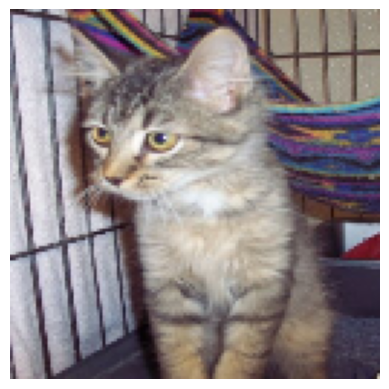

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Prediction: Cat


In [ ]:
image_path = "/content/cats_and_dogs_dataset/PetImages/Cat/2.jpg"
predict_image_from_path(model, image_path)